In [47]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Stock Market Forecasting Neural Networks for Multi-Output Regression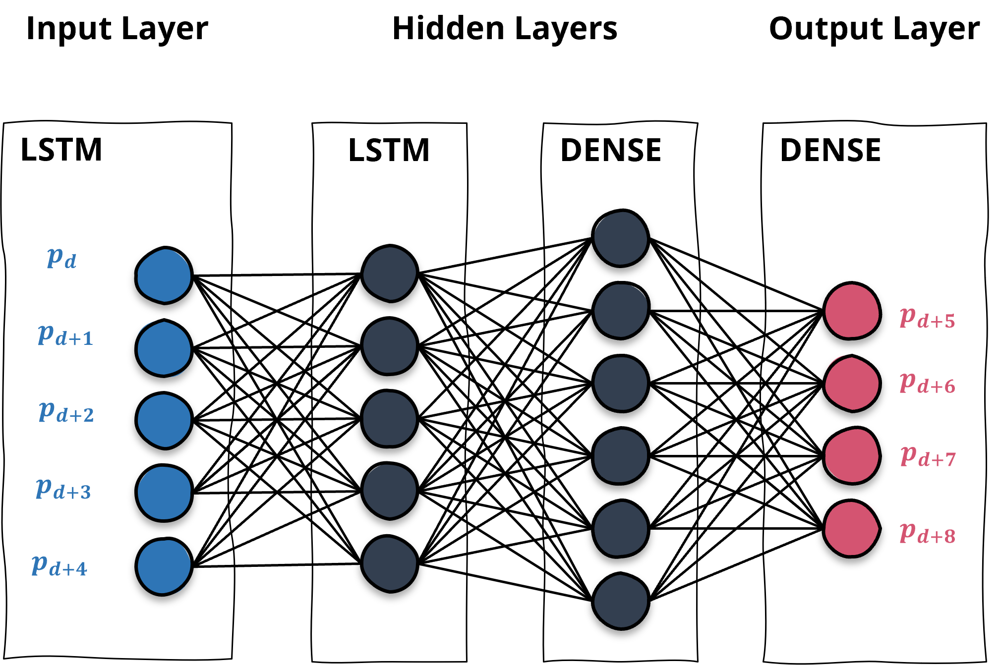



d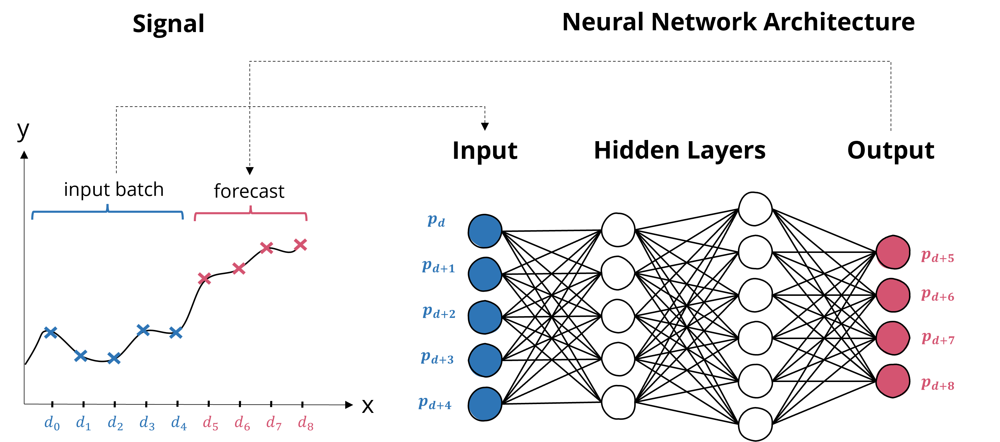The number of neurons in the first layer must match the input data, and the number of neurons in the output layer determines the period length of the predictions.


In a **multi-output regression model**, each neuron in the output layer is responsible for predicting a different time step in the future. To train such a model, *you need to provide a sequence of input data followed by the corresponding sequence of output data*. For example, if you want to predict the stock price for the next ten days, you would provide a sequence of input data containing the historical stock prices for the past 50 days, followed by a sequence of output data containing the stock prices for the next 10 days.

The design of network



```
CNNLSTMModel(
  (hybridNetwork): Sequential(
    (0): Conv1d(61, 200, kernel_size=(1,), stride=(1,))
    (1): ReLU()
    (2): LSTM(200, 200, dropout=0.3)
  )
  (endLinearLayer): Linear(in_features=200, out_features=24, bias=True)
)

```



In [48]:
import pandas as pd
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.tensorboard import SummaryWriter

In [49]:
config = {
    "data": {
        "window_size": 200,
        "train_split_size": 0.60,
        "validation_split_size": 0.30,  # in un secondo momento faremo la cross-validation
        "test_split_size": 0.10,

    },
    "model": {
        "input_size": 61,
        "num_lstm_layers": 1,
        "lstm_size": 200,
        "dropout": 0.3,
        "num_class": 1,
        "model_path": "Model/modelLSTMV0.pth",
        "model_name": "LSTMV0.txt",
        "save_model": True,
        "NstepsAhead": 24,
        "l1_factor": 1e-5,
        "weight_decay": 0.001,
    },
    "training": {
        "device": "cuda",  # "cuda" or "cpu"
        "batch_size": 64,
        "num_epochs": 100,
        "learning_rate": 3e-4,

        "momentum": 0.9,
        "loss_function": nn.MSELoss(),
        "optimizer": torch.optim.Adam,
        "scheduler": torch.optim.lr_scheduler.ReduceLROnPlateau,
        "scheduler_patience": 3 ,
        "scheduler_factor": 0.5,
        "scheduler_min_lr": 1e-6,
        "early_stopping": True,
        "early_stopping_patience": 22,
        "forget_bias": 0.1,
    },
}
from sklearn.preprocessing import MinMaxScaler

dataSetClean = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/FeatureEngineering&DATA/dataSetIMRCleaned.csv")
hlc3 = dataSetClean['hlc3']
dataSetClean.drop(labels=['hlc3'], axis=1, inplace=True)
dataSetClean.insert(0, 'hlc3', hlc3)

# Dataloading (sliding windows)
config["model"]["input_size"] = dataSetClean.shape[1]  # with 1 have number of features

dataSetClean.shape


scaler = MinMaxScaler()
scaler.fit(dataSetClean)
dataSet = scaler.transform(dataSetClean)

dataSet = pd.DataFrame(dataSet)

In [50]:
def slidingWindowsAhead(df, windowSize, nStepsAhead):
  x = []
  y = []
  dataLen = df.shape[0] # n rows
# The iteration step is now 'nStepsAhead' instead of 1.
  for i in range(windowSize, dataLen, nStepsAhead):
      if i + nStepsAhead > dataLen:
          break  # If we do not have enough data to predict further, we break the loop.
    # '_x' will contain 'windowSize' values as input data
      _x = df.iloc[i-windowSize:i].values
    # '_y' will contain 'nStepsAhead' values as labels
      _y = df.iloc[i:i+nStepsAhead, 0].values  # Select first column after row selection

      x.append(_x)
      y.append(_y)
  return np.array(x), np.array(y)

In [51]:
mX , mY = slidingWindowsAhead(dataSet,config["data"]["window_size"],config["model"]["NstepsAhead"])

trainWnum = int(len(mX) * config["data"]["train_split_size"])
valWnum = int(len(mX) * config["data"]["validation_split_size"])
testWnum = len(mX) - trainWnum - valWnum  # Remaining data for testing
trX = mX[:trainWnum]
valX = mX[trainWnum:trainWnum+valWnum]
testX = mX[trainWnum+valWnum:]
trY = mY[:trainWnum]
valY = mY[trainWnum:trainWnum+valWnum]
testY = mY[trainWnum+valWnum:]



print("_______ Dim mX & mY ______")
print(f"dim mX:{mX.shape} dim mY:{mY.shape}")
print("_____Dimension X & Y _____")
print(f"dim trX:{trX.shape} --- dim trY:{trY.shape} ")
print(f"dim valX:{valX.shape} --- dim valY:{valY.shape} ")
print(f"dim testX:{testX.shape} --- dim testY:{testY.shape} ")





# Convert from numpy arrays to torch tensors
trX_tensor = torch.tensor(trX, dtype=torch.float32)
trY_tensor = torch.tensor(trY, dtype=torch.float32).unsqueeze(1)
valX_tensor = torch.tensor(valX, dtype=torch.float32)
valY_tensor = torch.tensor(valY, dtype=torch.float32).unsqueeze(1)
testX_tensor = torch.tensor(testX, dtype=torch.float32)
testY_tensor = torch.tensor(testY, dtype=torch.float32).unsqueeze(1)

print("_____Dimension X & Y tensor _____")
print(f"dim trX:{trX_tensor.shape} --- dim trY:{trY_tensor.shape} ")
print(f"dim valX:{valX_tensor.shape} --- dim valY:{valY_tensor.shape} ")
print(f"dim testX:{testX_tensor.shape} --- dim testY:{testY_tensor.shape} ")


#print(f"dim valX:{valX_tensor} --- dim valY:{valY_tensor} ")

_______ Dim mX & mY ______
dim mX:(2158, 200, 61) dim mY:(2158, 24)
_____Dimension X & Y _____
dim trX:(1294, 200, 61) --- dim trY:(1294, 24) 
dim valX:(647, 200, 61) --- dim valY:(647, 24) 
dim testX:(217, 200, 61) --- dim testY:(217, 24) 
_____Dimension X & Y tensor _____
dim trX:torch.Size([1294, 200, 61]) --- dim trY:torch.Size([1294, 1, 24]) 
dim valX:torch.Size([647, 200, 61]) --- dim valY:torch.Size([647, 1, 24]) 
dim testX:torch.Size([217, 200, 61]) --- dim testY:torch.Size([217, 1, 24]) 


In [52]:
class TimeSeriesDataset(torch.utils.data.Dataset):
    def __init__(self, X_data, y_data):
        super(). __init__()
        self.X_data = X_data
        self.y_data = y_data

    def __len__(self):
        return len(self.X_data)

    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]


# Create Dataset instances
train_dataset = TimeSeriesDataset(trX_tensor, trY_tensor)
val_dataset = TimeSeriesDataset(valX_tensor, valY_tensor)
test_dataset = TimeSeriesDataset(testX_tensor, testY_tensor)

# Create DataLoader instances
train_loader = DataLoader(dataset=train_dataset,
                          batch_size=config["training"]["batch_size"],
                          shuffle=False)
""" bisogna fare una prova con shffle = True e False Tuttavia, per i dati strutturati come "finestre scorrevoli" (sliding windows), dove ogni campione è indipendente e contiene le informazioni temporali necessarie nel contesto della finestra stessa, l'operazione di shuffle potrebbe non essere dannosa. In questo caso, ogni finestra agisce come un campione indipendente e il modello impara da queste finestre piuttosto che dalla sequenza complessiva """
val_loader = DataLoader(dataset=val_dataset,
                        batch_size=config["training"]["batch_size"],
                        shuffle=False)
test_loader = DataLoader(dataset=test_dataset,
                         batch_size=config["training"]["batch_size"],
                         shuffle=False)

In [53]:
class CNNLSTMModel(nn.Module):

  def __init__(self, input_size, num_lstm_layers, dropout, num_class,
               sequence_length):
    super().__init__()

    # Definizione del modello usando nn.Sequential
    self.hybridNetwork = nn.Sequential(
        nn.Conv1d(in_channels=input_size,
                  out_channels=sequence_length,
                  kernel_size=1),
        nn.ReLU(),
        nn.LSTM(input_size=sequence_length,
                hidden_size=sequence_length,
                num_layers=num_lstm_layers,
                dropout=dropout,
                batch_first=False),
    )
    self.endLinearLayer = nn.Linear(sequence_length,config["model"]["NstepsAhead"])

  def forward(self, x):
    # Apply CNN layers
    x = x.permute(0, 2, 1)
    x = self.hybridNetwork[0](x)  # Conv1d
    x = self.hybridNetwork[1](x)  # ELU activation

    # Permute the dimensions for LSTM
    x = x.permute(2, 0, 1)

    # Apply LSTM layers
    x, (hidden, cell) = self.hybridNetwork[2](x)

    # Only take the output from the last time-step
    x = x[-1, :, :]

    # Apply final linear layer
    x = self.endLinearLayer(x)
    return x

In [54]:
hybridModelCNNLSTML1L2_24h = CNNLSTMModel(
    input_size=61,
    num_lstm_layers=config["model"]["num_lstm_layers"],
    dropout=config["model"]["dropout"],
    num_class=1,
    sequence_length=config["data"]["window_size"])
print(hybridModelCNNLSTML1L2_24h)
hybridModelCNNLSTML1L2_24h.to(config["training"]["device"])

# Parameters for regularization
l1_regularization = True
l1_factor = config["model"]["l1_factor"]
train_hist = []
val_hist = []
test_hist = []
loss_fn = torch.nn.MSELoss(reduction='mean')
optimizer = torch.optim.Adam(hybridModelCNNLSTML1L2_24h.parameters(),
                             lr=config["training"]["learning_rate"],weight_decay=config["model"]["weight_decay"]) # L2 reg

scheduler = config["training"]["scheduler"](
    optimizer,
    patience=config["training"]["scheduler_patience"],
    factor=config["training"]["scheduler_factor"],
    min_lr=config["training"]["scheduler_min_lr"])
best_val_loss = float('inf')
patience_counter = 0
loss_list = []
test_loss_list = []
# of accuracy for a regression model, with bootstrapping 95% of confident predictions

CNNLSTMModel(
  (hybridNetwork): Sequential(
    (0): Conv1d(61, 200, kernel_size=(1,), stride=(1,))
    (1): ReLU()
    (2): LSTM(200, 200, dropout=0.3)
  )
  (endLinearLayer): Linear(in_features=200, out_features=24, bias=True)
)


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "



# modificare la L1 reg in questo modo
---
 Train the model






```
for i in range(epochs):
    # Forward propagation
    yhat = model(x)
    
    # Loss function
    loss = lossfunc(yhat,y)
    
    # Calculate L1 term
    L1_term = torch.tensor(0., requires_grad=True)
    for name, weights in model.named_parameters():
        if 'bias' not in name:
            weights_sum = torch.sum(torch.abs(weights))
            L1_term = L1_term + weights_sum
    L1_term = L1_term / nweights
    
    # Regularize loss using L1 regularization
    loss = loss - L1_term * l1_lambda
    losses[i] = loss.detach().item()
    
    # Back propagation
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()*testo in corsivo*
```



In [55]:
writer = SummaryWriter()
# Load the TensorBoard notebook extension
%load_ext tensorboard

def trainLoop(model, train_loader, optimizer, scheduler, loss_fn):
  model.train()
  train_loss = 0
  all_predictions = []
  all_targets = []
  for batch_idx, (data, target) in enumerate(train_loader):
    data, target = data.to(config["training"]["device"]), target.to(
        config["training"]["device"])
    optimizer.zero_grad()
    target = target.squeeze(1)
    output = model(data)
    writer.add_graph(model, data)
    loss = loss_fn(output, target)
    writer.add_scalar("Train/val", loss, batch_idx)
    if l1_regularization:
      # Manually add L1 regularization term
      l1_penalty = sum(p.abs().sum() for p in model.parameters()) * l1_factor
      loss += l1_penalty
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    all_predictions.extend(
        output.squeeze().tolist())  # Flatten and accumulate predictions
    all_targets.extend(
        target.squeeze().tolist())
  avg_loss = train_loss / len(train_loader)
  print(f"Train loss: {avg_loss}")
  return train_loss, avg_loss,all_predictions,all_targets


def valLoop(model, val_loader, loss_fn):
  all_predictions = []
  all_targets = []
  valLoss = 0
  model.eval()
  with torch.no_grad():
    for batch_idx, (data, target) in enumerate(val_loader):
      data, target = data.to(config["training"]["device"]), target.to(
        config["training"]["device"])
      target = target.squeeze(1)
      output = model(data)
      writer.add_graph(model, data)
      loss = loss_fn(output, target)
      writer.add_scalar("Loss/val", loss, batch_idx)
      valLoss += loss.item()
      all_predictions.extend(
        output.squeeze().tolist())  # Flatten and accumulate predictions
      all_targets.extend(
        target.squeeze().tolist())


    avg_loss = valLoss / len(val_loader)
  print(f"valLoss: {avg_loss}")
  return valLoss, avg_loss,all_predictions,all_targets



def testLoop(model, test_loader, loss_fn):
  all_predictionsTS = []
  all_targetsTS = []
  testLoss = 0
  model.eval()
  with torch.no_grad():
    for batch_idx, (data, target) in enumerate(test_loader):
      data, target = data.to(config["training"]["device"]), target.to(
        config["training"]["device"])
      target = target.squeeze(1)
      output = model(data)
      writer.add_graph(model, data)
      loss = loss_fn(output, target)
      writer.add_scalar("Loss/test", loss, batch_idx)
      testLoss += loss.item()
      all_predictionsTS.extend(
        output.squeeze().tolist())  # Flatten and accumulate predictions
      all_targetsTS.extend(
        target.squeeze().tolist())


    avg_loss = testLoss / len(test_loader)
  print(f"TestLoss: {avg_loss}")
  return testLoss, avg_loss,all_predictionsTS,all_targetsTS



The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [56]:


# epoch loop

for epoch in range(config["training"]["num_epochs"]):
    trainCum_loss, avg_loss,all_predictionsTR,all_targetsTR = trainLoop(hybridModelCNNLSTML1L2_24h, train_loader, optimizer, scheduler, loss_fn) # tengo all_pred/target dell'ultima epoca e stop
    valCum_loss, avg_val_loss,all_predictionsVL,all_targetsVL = valLoop(hybridModelCNNLSTML1L2_24h, val_loader, loss_fn)
    train_hist.append(avg_loss)
    val_hist.append(avg_val_loss)
    print(f"Epoch: {epoch} train loss: {avg_loss} val loss: {avg_val_loss} \n")

    # Controllare il salvataggio del miglior modello per l'epoca corrente
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
    else:
        patience_counter += 1
    # Controllare l'early stopping
    if patience_counter > config["training"]["early_stopping_patience"]:
        print("Early stopping triggered.")
        break
    # Aggiornamento dello scheduler, se usato
    scheduler.step(avg_val_loss)

# model performance evalutation on TestSet (chronological test)

testLoss, avg_loss,all_predictionsTS,all_targetsTS = testLoop(hybridModelCNNLSTML1L2_24h, test_loader, loss_fn)


writer.flush()


Train loss: 0.18689020758583433
valLoss: 0.1259886845946312
Epoch: 0 train loss: 0.18689020758583433 val loss: 0.1259886845946312 

Train loss: 0.13324284801880518
valLoss: 0.03741250672927973
Epoch: 1 train loss: 0.13324284801880518 val loss: 0.03741250672927973 

Train loss: 0.10562603672345479
valLoss: 0.005518395678584718
Epoch: 2 train loss: 0.10562603672345479 val loss: 0.005518395678584718 

Train loss: 0.0816867926291057
valLoss: 0.008010273502970284
Epoch: 3 train loss: 0.0816867926291057 val loss: 0.008010273502970284 

Train loss: 0.082390624497618
valLoss: 0.006903450756164437
Epoch: 4 train loss: 0.082390624497618 val loss: 0.006903450756164437 

Train loss: 0.06719607363144557
valLoss: 0.002113075022035363
Epoch: 5 train loss: 0.06719607363144557 val loss: 0.002113075022035363 

Train loss: 0.06407167212594123
valLoss: 0.006880048937587576
Epoch: 6 train loss: 0.06407167212594123 val loss: 0.006880048937587576 

Train loss: 0.05306829246027129
valLoss: 0.00120986765647434

In [57]:
model_filename = "/content/drive/MyDrive/Colab Notebooks/Model-PTH/TunHybridCNNLSTM24h_L1L2_epoch_{}_loss_{:.4f}.pth".format(epoch, best_val_loss)
torch.save(hybridModelCNNLSTML1L2_24h.state_dict(), model_filename)
print(f'Model saved as {model_filename}')

Model saved as /content/drive/MyDrive/Colab Notebooks/Model-PTH/TunHybridCNNLSTM24h_L1L2_epoch_99_loss_0.0004.pth


In [58]:
# KPI data struct

print("Results________:")
print(f"AVG train test error over trainDataSet:{avg_loss}")
print(f"all_predictions dim {len(all_predictionsTS)} & all_targets dim {len(all_targetsTS)}")
#print(f"pred1 {all_predictions[1]} & target {all_targets[1]}")


class TestResults:
  def __init__(self, all_targetsTS, all_predictionsTS, mse, rmse, r2):

      self.all_targetsTS = all_targetsTS
      self.all_predictionsTS = all_predictionsTS
      self.mse = mse
      self.rmse = rmse
      self.r2 = r2


  def to_dataframe(self):
    return pd.DataFrame({
      "all_targetsTS": self.all_targetsTS,
      "all_predictionsTS": self.all_predictionsTS,
  })

  def resultPerformance(self):
    return pd.DataFrame({
          "MSE": [self.mse],
          "RMSE": [self.rmse],
          "R2": [self.r2]
      })
  def setMse(self, mse):
    self.mse = mse
  def setRmse(self, rmse):
    self.rmse = rmse
  def setR2(self, r2):
    self.r2 = r2

  def plot_results(self):
    df = self.to_dataframe()
    plt.figure(figsize=(15, 5))

    x_range = range(len(df['all_targetsTS'][0])) if isinstance(df['all_targetsTS'][0], list) else range(len(df['all_targetsTS']))
        # Xinput may not be used in scatter plot if its shape does not conform to the others
    plt.scatter(x_range, df['all_targetsTS'][0], label='True Value', color='blue')  # Assume first instance
    plt.scatter(x_range, df['all_predictionsTS'][0], label='Predicted Value', color='red')  # Assume first instance

    plt.title('Test Results')
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

TestResult = TestResults(all_targetsTS, all_predictionsTS, 0, 0,0)

TestResult_df = TestResult.to_dataframe()
all_targetsTS = TestResult_df["all_targetsTS"]
all_predictionsTS = TestResult_df["all_predictionsTS"]

# If all_targetsTS and all_predictionsTS are lists of lists, we need to flatten them
# Flattening only needs to happen if all_targetsTS and all_predictionsTS are indeed lists of lists
all_targetsTS_flat = [item for sublist in all_targetsTS for item in sublist] if isinstance(all_targetsTS.iloc[0], list) else all_targetsTS
all_predictionsTS_flat = [item for sublist in all_predictionsTS for item in sublist] if isinstance(all_predictionsTS.iloc[0], list) else all_predictionsTS

# Now calculate the overall MSE, RMSE, and R2 score using the flattened lists
mse_test = mean_squared_error(all_targetsTS_flat, all_predictionsTS_flat)
rmse_test = mean_squared_error(all_targetsTS_flat, all_predictionsTS_flat, squared=False)
r2_test = r2_score(all_targetsTS_flat, all_predictionsTS_flat)

# Print the results
print(f"Test MSE: {mse_test}")
print(f"Test RMSE: {rmse_test}")
print(f"Test R2: {r2_test}")
# Update the TestResult object with the new computed overall metrics
TestResult.setMse(mse_test)
TestResult.setRmse(rmse_test)
TestResult.setR2(r2_test)

TestResult.resultPerformance().head()

Results________:
AVG train test error over trainDataSet:0.00020446167036425322
all_predictions dim 217 & all_targets dim 217
Test MSE: 0.00019474933095564259
Test RMSE: 0.013955261765930533
Test R2: 0.9792298746492878


,MSE,RMSE,R2
0,0.000195,0.013955,0.97923


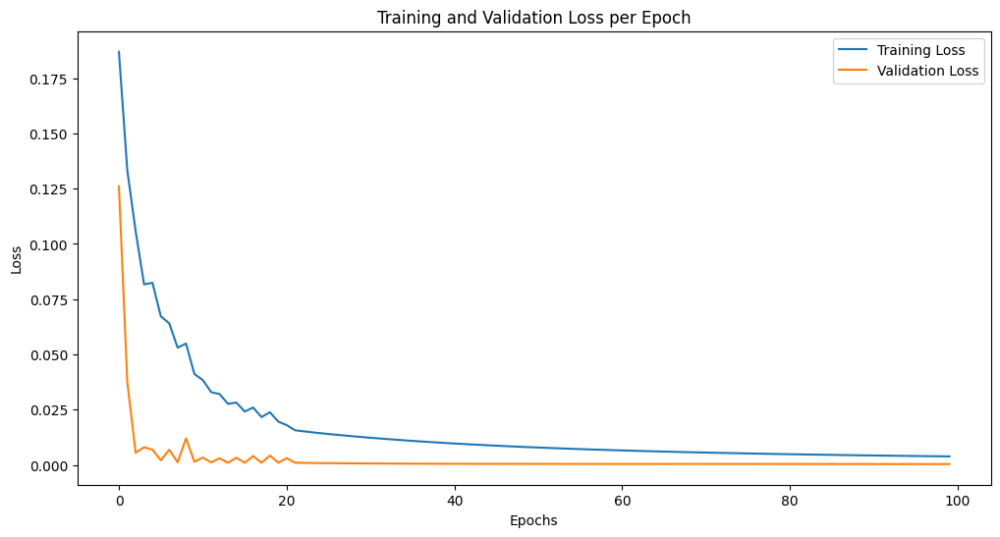

In [59]:
import matplotlib.pyplot as plt



# Grafico di training e validation loss
plt.figure(figsize=(12, 6))
plt.plot(train_hist, label='Training Loss')
plt.plot(val_hist, label='Validation Loss')
plt.title('Training and Validation Loss per Epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

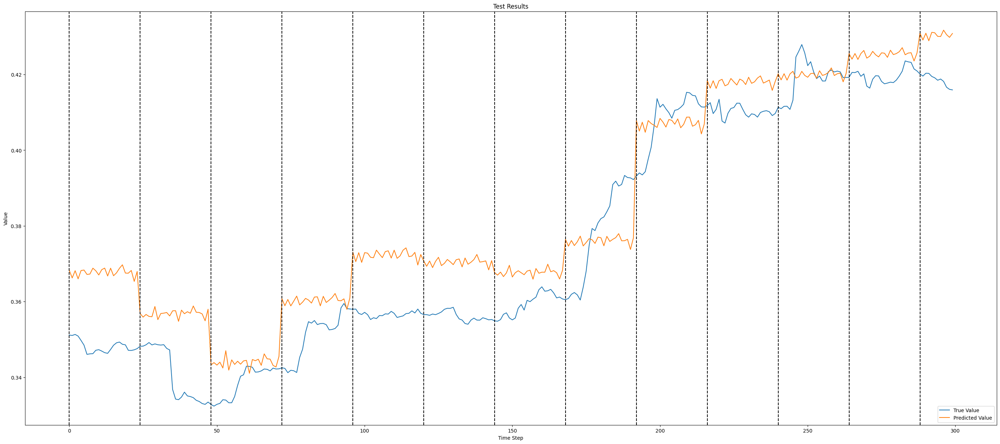

In [60]:
plt.figure(figsize=(35, 15))
plt.plot(all_targetsTS_flat[:300], label='True Value')
plt.plot(all_predictionsTS_flat[:300], label='Predicted Value')
for i in range(0, 300, config['model']['NstepsAhead']):
    plt.axvline(x=i, color='k', linestyle='--')

plt.title('Test Results')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.legend()
plt.show()


Mean MSE over dataset: 0.00019474933095564259


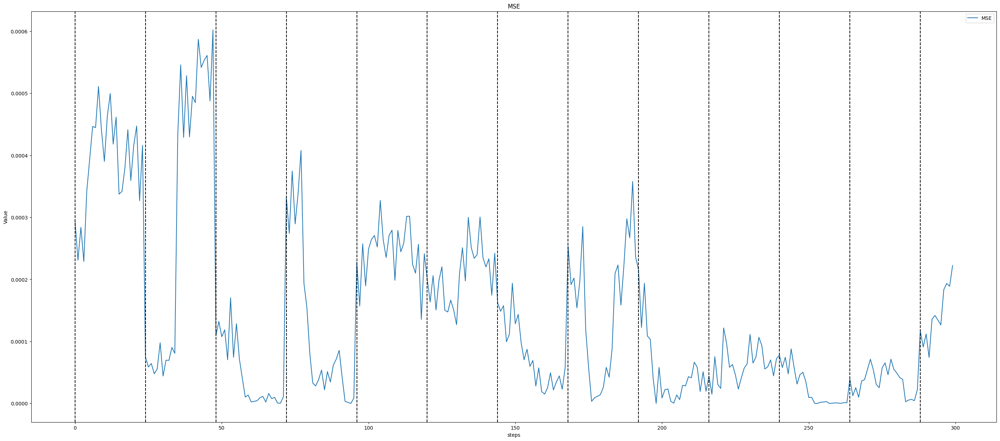

In [61]:
# grafico andamento del mse elemento per elemento di tutto il training set

dfWresult = pd.DataFrame()


dfWresult["Y_true"] = all_targetsTS_flat
dfWresult["Y_pred"] = all_predictionsTS_flat




for i in range(len(dfWresult)):
   # Ensure the true and predicted values are passed as lists
   mse = mean_squared_error([dfWresult.at[i,"Y_true"]], [dfWresult.at[i,"Y_pred"]])
   dfWresult.at[i, "mse"] = mse

mse_mean = mean_squared_error(dfWresult["Y_true"], dfWresult["Y_pred"])

print(f"Mean MSE over dataset: {mse_mean}")
plt.figure(figsize=(35, 15))
plt.plot(dfWresult["mse"].iloc[:300], label='MSE')  # Corrected line
# Insert a vertical line every 24 steps
for i in range(0, 300, config['model']['NstepsAhead']):
    plt.axvline(x=i, color='k', linestyle='--')
plt.title('MSE')
plt.xlabel('steps')
plt.ylabel('Value')
plt.legend()
plt.show()

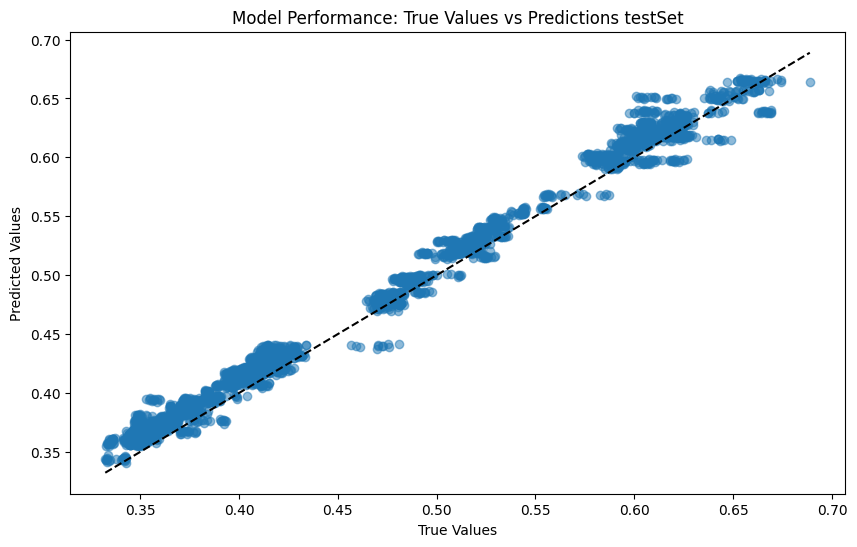

In [62]:
import matplotlib.pyplot as plt
import numpy as np  # Import numpy if it's not already

# Assuming y_true_flat and y_pred_flat are lists, convert them to NumPy arrays
y_true_flat_np = np.array(all_targetsTS_flat)
y_pred_flat_np = np.array(all_predictionsTS_flat)

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_true_flat_np, y_pred_flat_np, alpha=0.5)
plt.title('Model Performance: True Values vs Predictions testSet')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')

# Plot the perfect prediction line
max_val = max(y_true_flat_np.max(), y_pred_flat_np.max())
min_val = min(y_true_flat_np.min(), y_pred_flat_np.min())
plt.plot([min_val, max_val], [min_val, max_val], 'k--')

plt.show()

In [63]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Assuming 'scaler' is the MinMaxScaler instance that was used to scale the dataset originally
# and 'dataSet' is your original DataFrame before normalization
# Load the scaler from the saved file (you should replace the file path with the location where you stored your scaler)



# Denormalize y_true
dummy_feature_count = dataSet.shape[1] - 1
dummy_array_true = np.zeros((y_true_flat_np.shape[0], dummy_feature_count))
input_array_true = np.column_stack((dummy_array_true, y_true_flat_np))
denormalized_y_true = scaler.inverse_transform(input_array_true)[:, -1]

# Denormalize y_pred
dummy_array_pred = np.zeros((y_pred_flat_np.shape[0], dummy_feature_count))
input_array_pred = np.column_stack((dummy_array_pred, y_pred_flat_np))
denormalized_y_pred = scaler.inverse_transform(input_array_pred)[:, -1]

# Create DataFrame for denormalized values
denormalizeDf = pd.DataFrame()
denormalizeDf["Y_true"] = denormalized_y_true
denormalizeDf["Y_pred"] = denormalized_y_pred

# Calculate MSE for each pair of true and predicted values
for i in range(len(denormalizeDf)):
   mse = mean_squared_error([denormalizeDf.at[i,"Y_true"]], [denormalizeDf.at[i,"Y_pred"]])
   denormalizeDf.at[i, "mse"] = mse

# Calculate the mean MSE
mse_mean = mean_squared_error(denormalizeDf["Y_true"], denormalizeDf["Y_pred"])

# Display the first few rows of the DataFrame
denormalizeDf.head()


,Y_true,Y_pred,mse
0,3.639885e+09,4.183677e+09,2.957093e+17
1,3.636629e+09,4.118637e+09,2.323317e+17
2,3.645045e+09,4.179361e+09,2.854937e+17
3,3.631402e+09,4.111127e+09,2.301364e+17
4,3.594491e+09,4.180999e+09,3.439915e+17


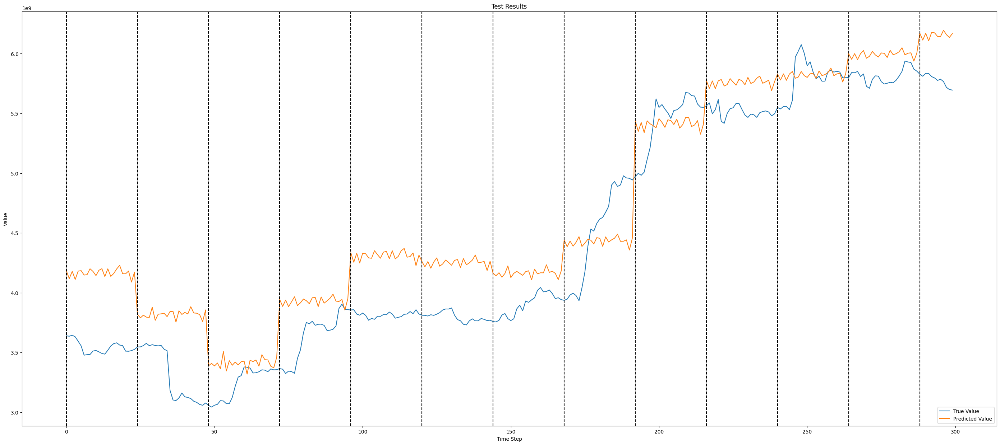

In [64]:
plt.figure(figsize=(35, 15))
plt.plot(denormalized_y_true[:300], label='True Value')
plt.plot(denormalized_y_pred[:300], label='Predicted Value')
for i in range(0, 300, config['model']['NstepsAhead']):
    plt.axvline(x=i, color='k', linestyle='--')

plt.title('Test Results')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.legend()
plt.show()

In [65]:
tensorboard --logdir=runs

Reusing TensorBoard on port 6006 (pid 11192), started 0:05:31 ago. (Use '!kill 11192' to kill it.)

<IPython.core.display.Javascript object>